In [1]:
%matplotlib inline

In [2]:
import functools

import torch
import torch.nn as nn
import torch.optim as optim
from torch.autograd import Variable
import torchvision
import random
import matplotlib.pyplot as plt
from torchvision import datasets, transforms

In [3]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='1'

In [4]:
class SkipConnection(nn.Module):
    def __init__(self, outer_nc, inner_nc, input_nc=None,submodule=None, outermost=False, innermost=False, 
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(SkipConnection, self).__init__()
        self.outermost = outermost
        if type(norm_layer) == functools.partial:
            use_bias = norm_layer.func == nn.InstanceNorm2d
        else:
            use_bias = norm_layer == nn.InstanceNorm2d
        if input_nc is None:
            input_nc = outer_nc
        downconv = nn.Conv2d(input_nc, inner_nc, kernel_size=4,
                             stride=2, padding=1, bias=use_bias)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = norm_layer(inner_nc)
        uprelu = nn.ReLU(True)
        upnorm = norm_layer(outer_nc)

        if outermost:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1)
            down = [downconv]
            if output_function == nn.Tanh:
                up = [uprelu, upconv, nn.Tanh()]
            else:
                up = [uprelu, upconv, nn.Sigmoid()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(inner_nc, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(inner_nc * 2, outer_nc,
                                        kernel_size=4, stride=2,
                                        padding=1, bias=use_bias)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]

            if use_dropout:
                model = down + [submodule] + up + [nn.Dropout(0.5)]
            else:
                model = down + [submodule] + up

        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

In [5]:
class Generator(nn.Module):
    def __init__(self, input_nc, output_nc, ngf=32,
                 norm_layer=nn.BatchNorm2d, use_dropout=False, output_function=nn.Sigmoid):
        super(Generator, self).__init__()
        # construct unet structure
        unet_block = SkipConnection(ngf * 8, ngf * 8, input_nc=None, submodule=None, norm_layer=norm_layer, innermost=True)
        unet_block = SkipConnection(ngf * 4, ngf * 8, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf * 2, ngf * 4, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(ngf, ngf * 2, input_nc=None, submodule=unet_block, norm_layer=norm_layer)
        unet_block = SkipConnection(output_nc, ngf, input_nc=input_nc, submodule=unet_block, outermost=True, norm_layer=norm_layer, output_function=output_function)

        self.model = unet_block

    def forward(self, input):
        return self.model(input)

In [6]:
device = torch.device('cuda:0')

In [7]:
# Build ResNet 18 Module 

# https://github.com/kuangliu/pytorch-cifar

import torch
import torch.nn as nn
import torch.nn.functional as F


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(BasicBlock, self).__init__()
        self.conv1 = nn.Conv2d(
            in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, in_planes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3,
                               stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv3 = nn.Conv2d(planes, self.expansion *
                               planes, kernel_size=1, bias=False)
        self.bn3 = nn.BatchNorm2d(self.expansion*planes)

        self.shortcut = nn.Sequential()
        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes,
                          kernel_size=1, stride=stride, bias=False),
                nn.BatchNorm2d(self.expansion*planes)
            )

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = F.relu(self.bn2(self.conv2(out)))
        out = self.bn3(self.conv3(out))
        out += self.shortcut(x)
        out = F.relu(out)
        return out


class ResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=10):
        super(ResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3,
                               stride=1, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(64)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Linear(512*block.expansion, num_classes)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.avg_pool2d(out, 4)
        out = out.view(out.size(0), -1)
        out = self.linear(out)
        return out
    
def ResNet18():
    return ResNet(BasicBlock, [2, 2, 2, 2])

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [9]:
generator = Generator(input_nc=6, output_nc=3)
generator = generator.to(device)
generator.apply(weights_init)

classifier = ResNet18()
classifier = classifier.to(device)
classifier.apply(weights_init)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [10]:
def prepare_dataloader(num_workers=8,
                       train_batch_size=128,
                       eval_batch_size=256):

    train_transform = transforms.Compose([
        transforms.RandomCrop(32, padding=4),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
    ])

    test_transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    train_set = torchvision.datasets.CIFAR10(root="data",
                                             train=True,
                                             download=True,
                                             transform=train_transform)
    
    test_set = torchvision.datasets.CIFAR10(root="data",
                                            train=False,
                                            download=True,
                                            transform=test_transform)

    train_sampler = torch.utils.data.RandomSampler(train_set)
    test_sampler = torch.utils.data.SequentialSampler(test_set)

    train_loader = torch.utils.data.DataLoader(dataset=train_set,
                                               batch_size=train_batch_size,
                                               sampler=train_sampler,
                                               num_workers=num_workers)

    test_loader = torch.utils.data.DataLoader(dataset=test_set,
                                              batch_size=eval_batch_size,
                                              sampler=test_sampler,
                                              num_workers=num_workers)

    return train_loader, test_loader

In [11]:
train_loader, test_loader = prepare_dataloader()

Files already downloaded and verified
Files already downloaded and verified


In [12]:
# MSE loss
mse_criterion = nn.MSELoss()

ce_criterion = nn.CrossEntropyLoss()

In [13]:
# optimizerG = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))

# optimizerC = optim.Adam(classifier.parameters(), lr=0.01, betas=(0.5, 0.999))

optimizer = optim.Adam(generator.parameters(), lr=0.01, betas=(0.5, 0.999))
optimizer.add_param_group({'params': classifier.parameters()})

In [14]:
class AverageMeter(object):
    """
    Computes and stores the average and current value.
    """

    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

In [15]:
# transform = transforms.Normalize(mean=(0.485, 0.456, 0.406), 
#                              std=(0.229, 0.224, 0.225))

In [16]:
def show_images(images):
    grid_img = torchvision.utils.make_grid(images, nrow=3)
    plt.imshow(grid_img.permute(1,2,0))
    plt.show()

In [17]:
best_generator_loss = 1

In [18]:
best_classifier_loss = 1

In [19]:
# Training generator 

def train_generator(train_loader, epoch, generator, mse_criterion, cuda=True, show=True):
    generator.train()
    
    g_losses = AverageMeter()
    
    output_images = []

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        real_label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            real_label = real_label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        
        # Backward
        g_loss.backward()

        optimizerG.step()
    
    print('Training generator - Epoch {} g_loss = {}'.format(epoch, g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)

In [20]:
# Training classifier 

def train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True):
    generator.eval()
    classifier.train()

    c_losses = AverageMeter() 
    
    correct = 0
    total = 0

    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()
        
        # Select half dataset for container images
        pivot = len(image) 
        container_image = torch.zeros(image.shape)

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            image = image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        with torch.no_grad():
            privacy_image = generator(gen_input_v)
        print(privacy_image)
        print(privacy_image)
        pred_label = classifier(privacy_image)
        pred_label = pred_label.to(device)

        # Calculate loss 
        c_loss = ce_criterion(pred_label, label)
        
        # Average loss 
        c_losses.update(c_loss.data, pivot)
        
        # Backward
        c_loss.backward()

        optimizerC.step()
        
        # Calculate accuracy
        _, predicted = pred_label.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    
    print('Training classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))

In [21]:
def test_generator(test_loader, generator, mse_criterion, cuda=True, show=True):    
    global best_generator_loss
    
    generator.eval()
    
    g_losses = AverageMeter() 
    
    output_images = []
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) // 2 
            container_image = image[0:pivot, :, :, :]
            real_image = image[pivot:pivot*2, :, :, :]
            real_label = label[pivot:pivot*2]

            gen_input = torch.cat([container_image, real_image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                real_image = real_image.to(device)
                real_label = real_label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)

            # Average loss 
            g_losses.update(g_loss.data, pivot)
    
    
    print('Testing generator - g_loss = {}'.format(g_losses.avg))    
    
    # Save checkpoint 
    if g_losses.avg < best_generator_loss:
        best_generator_loss = g_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/my_best_generator_loss.pth')
        print('Save best checkpoint with loss {}'.format(g_losses.avg))
    # Show some output images
    if show:
        show_images(output_images)        

In [22]:
def test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_classifier_loss
    generator.eval()
    classifier.eval()
 
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            # Select half dataset for container images
            pivot = len(image) 
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            print('container shape: ', container_image.shape)
            print('original image shape: ', image.shape)
            print('privacy shape: ', privacy_image.shape)
            import pdb; pdb.set_trace()
            pred_label = classifier(privacy_image)
            
            # Calculate loss 
            c_loss = ce_criterion(pred_label, label)

            # Average loss 
            c_losses.update(c_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred_label.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('Testing classifier - Epoch {} c_loss = {} acc = {}'.format(epoch, c_losses.avg, correct/total))         
    # Save checkpoint 
    if c_losses.avg < best_classifier_loss:
        best_classifier_loss = c_losses.avg
        torch.save(classifier.state_dict(), 'checkpoints/my_best_classifier_loss.pth')
        print('Save best checkpoint with loss {}'.format(c_losses.avg))

In [23]:
# Training generator first
# for epoch in range(100):
#     show = False
#     if epoch % 20 == 0:
#         show = True
#     train_generator(train_loader, epoch, generator, mse_criterion, show=show)
#     test_generator(test_loader, generator, mse_criterion, show=show)

In [24]:
# generator.load_state_dict(torch.load('checkpoints/best_generator_loss.pth'))

In [25]:
# test_generator(test_loader, generator, mse_criterion, show=True)

In [26]:
# for epoch in range(100):
#     train_classifier(train_loader, epoch, generator, classifier, ce_criterion, cuda=True, show=True)
#     test_classifier(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)

In [27]:
def train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True):
    generator.train()
    classifier.train()
    
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    
    output_images = []
    print('Training - Epoch {}'.format(epoch))
    for i, (image, label) in enumerate(train_loader):
        generator.zero_grad()
        classifier.zero_grad()

        # Select half dataset for container images
        pivot = len(image) // 2 
        container_image = image[0:pivot, :, :, :]
        real_image = image[pivot:pivot*2, :, :, :]
        label = label[pivot:pivot*2]

        # Create input of generator (6-dims: batch_size x 6 x 32 x 32)
        gen_input = torch.cat([container_image, real_image], dim=1)
        
        # To cuda
        if cuda:
            container_image = container_image.to(device)
            real_image = real_image.to(device)
            label = label.to(device)
            gen_input = gen_input.to(device)

        # Create variable
        gen_input_v = Variable(gen_input)
        container_image_v = Variable(container_image)

        # Output of model 
        privacy_image = generator(gen_input_v)
        pred = classifier(privacy_image)
        pred = pred.to(device)
        
        if i % 100 == 0 and show:
            index = random.randint(0, pivot - 1)
            output_images.extend([container_image[index].cpu(), real_image[index].cpu(), privacy_image[index].cpu()])

        # Calculate loss 
        g_loss = mse_criterion(privacy_image, container_image_v)
        c_loss = ce_criterion(pred, label)
        overall_loss = 0.7 * g_loss + 0.3 * c_loss
        
        # Average loss 
        g_losses.update(g_loss.data, pivot)
        c_losses.update(c_loss.data, pivot)
        overall_losses.update(overall_loss.data, pivot)
        
        # Backward
        overall_loss.backward()

        optimizer.step()
        
        # Calculate accuracy
        _, predicted = pred.max(1)
        total += label.size(0)
        correct += predicted.eq(label).sum().item()
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))
    # Show some output images
    if show:
        show_images(output_images)

In [28]:
best_overall_loss = 100
def test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True):
    global best_overall_loss
    generator.eval()
    classifier.eval()
 
    overall_losses = AverageMeter()
    g_losses = AverageMeter()
    c_losses = AverageMeter()
    
    correct = 0
    total = 0
    output_images = []
    print('Testing - Epoch {}'.format(epoch))
    with torch.no_grad():
        for i, (image, label) in enumerate(test_loader):
            pivot = len(image)
            
            container_image = torch.zeros(image.shape)
            
            gen_input = torch.cat([container_image, image], dim=1)

            # To cuda
            if cuda:
                container_image = container_image.to(device)
                image = image.to(device)
                label = label.to(device)
                gen_input = gen_input.to(device)

            gen_input_v = Variable(gen_input)
            container_image_v = Variable(container_image)

            # Output of model 
            privacy_image = generator(gen_input_v)
            pred = classifier(privacy_image)
            
            if i % 100 == 0 and show:
                index = random.randint(0, pivot - 1)
                output_images.extend([container_image[index].cpu(), image[index].cpu(), privacy_image[index].cpu()])
            
            # Calculate loss 
            g_loss = mse_criterion(privacy_image, container_image_v)
            c_loss = ce_criterion(pred, label)
            overall_loss = 0.7 * g_loss + 0.3 * c_loss

            # Average loss 
            g_losses.update(g_loss.data, pivot)
            c_losses.update(c_loss.data, pivot)
            overall_losses.update(overall_loss.data, pivot)

            # Calculate accuracy
            _, predicted = pred.max(1)
            total += label.size(0)
            correct += predicted.eq(label).sum().item()
    
    print('overall - overall_loss = {}'.format(overall_losses.avg))
    print('generator - g_loss = {}'.format(g_losses.avg))
    print('classifier - c_loss = {} acc = {}'.format(c_losses.avg, correct/total))      
    # Save checkpoint 
    if overall_losses.avg < best_overall_loss:
        best_overall_loss = overall_losses.avg
        torch.save(generator.state_dict(), 'checkpoints/best_e2e_w73_generator_loss.pth')
        torch.save(classifier.state_dict(), 'checkpoints/best_e2e_w73_classifier_loss.pth')
        print('Save best checkpoint with overall loss {} - g_loss {} - c_loss {}'.format(overall_losses.avg, g_losses.avg, c_losses.avg))
    if show:
        show_images(output_images)

Training - Epoch 0
overall - overall_loss = 0.6740008592605591
generator - g_loss = 0.030581435188651085
classifier - c_loss = 2.1753132343292236 acc = 0.20016


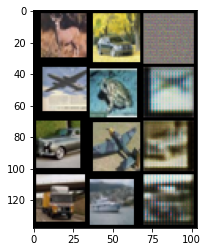

Testing - Epoch 0
overall - overall_loss = 0.6243325471878052
generator - g_loss = 0.012292381376028061
classifier - c_loss = 2.0524260997772217 acc = 0.2451
Save best checkpoint with overall loss 0.6243325471878052 - g_loss 0.012292381376028061 - c_loss 2.0524260997772217


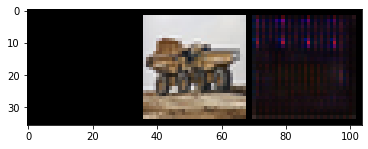

Training - Epoch 1
overall - overall_loss = 0.5821558833122253
generator - g_loss = 0.01834307238459587
classifier - c_loss = 1.897718071937561 acc = 0.29284


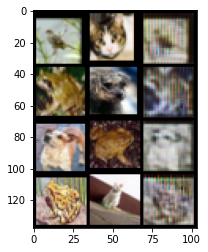

Testing - Epoch 1
overall - overall_loss = 0.538665771484375
generator - g_loss = 0.006144912447780371
classifier - c_loss = 1.7812143564224243 acc = 0.344
Save best checkpoint with overall loss 0.538665771484375 - g_loss 0.006144912447780371 - c_loss 1.7812143564224243


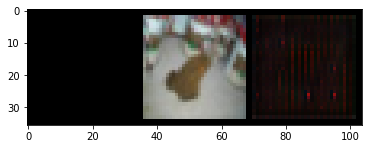

Training - Epoch 2
overall - overall_loss = 0.5356224775314331
generator - g_loss = 0.016544189304113388
classifier - c_loss = 1.7468045949935913 acc = 0.35208


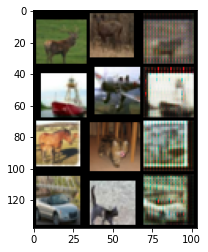

Testing - Epoch 2
overall - overall_loss = 0.5379815697669983
generator - g_loss = 0.008180936798453331
classifier - c_loss = 1.7741823196411133 acc = 0.3514
Save best checkpoint with overall loss 0.5379815697669983 - g_loss 0.008180936798453331 - c_loss 1.7741823196411133


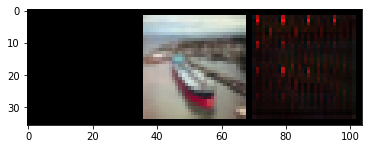

Training - Epoch 3
overall - overall_loss = 0.5004292726516724
generator - g_loss = 0.01536706741899252
classifier - c_loss = 1.6322410106658936 acc = 0.39976


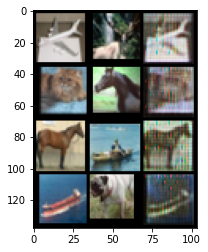

Testing - Epoch 3
overall - overall_loss = 0.47852641344070435
generator - g_loss = 0.006320689804852009
classifier - c_loss = 1.5803395509719849 acc = 0.4305
Save best checkpoint with overall loss 0.47852641344070435 - g_loss 0.006320689804852009 - c_loss 1.5803395509719849


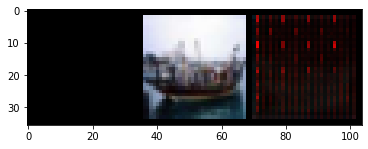

Training - Epoch 4
overall - overall_loss = 0.4765124022960663
generator - g_loss = 0.014817357994616032
classifier - c_loss = 1.5538004636764526 acc = 0.43104


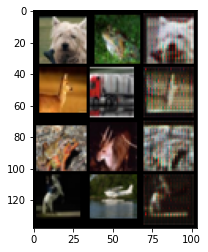

Testing - Epoch 4
overall - overall_loss = 0.6608357429504395
generator - g_loss = 0.007234453223645687
classifier - c_loss = 2.1859049797058105 acc = 0.3306


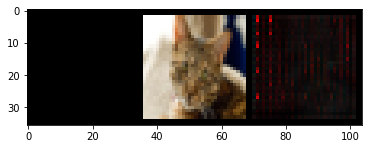

Training - Epoch 5
overall - overall_loss = 0.4569288194179535
generator - g_loss = 0.014057805761694908
classifier - c_loss = 1.4902942180633545 acc = 0.45136


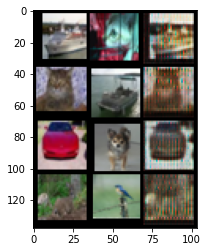

Testing - Epoch 5
overall - overall_loss = 0.43123742938041687
generator - g_loss = 0.012353138998150826
classifier - c_loss = 1.4086339473724365 acc = 0.4865
Save best checkpoint with overall loss 0.43123742938041687 - g_loss 0.012353138998150826 - c_loss 1.4086339473724365


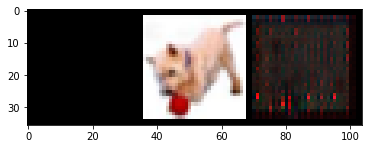

Training - Epoch 6
overall - overall_loss = 0.44326210021972656
generator - g_loss = 0.013412976637482643
classifier - c_loss = 1.4462425708770752 acc = 0.46924


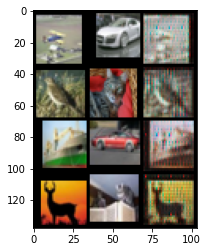

Testing - Epoch 6
overall - overall_loss = 0.4389885663986206
generator - g_loss = 0.016942255198955536
classifier - c_loss = 1.4237632751464844 acc = 0.4832


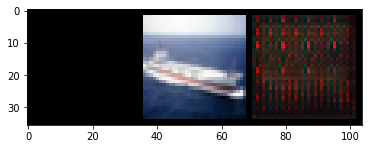

Training - Epoch 7
overall - overall_loss = 0.4303934574127197
generator - g_loss = 0.013792140409350395
classifier - c_loss = 1.402463436126709 acc = 0.4908


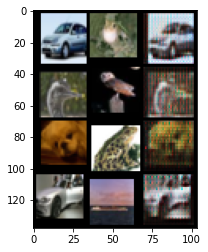

Testing - Epoch 7
overall - overall_loss = 0.413603812456131
generator - g_loss = 0.015870096161961555
classifier - c_loss = 1.3416489362716675 acc = 0.5083
Save best checkpoint with overall loss 0.413603812456131 - g_loss 0.015870096161961555 - c_loss 1.3416489362716675


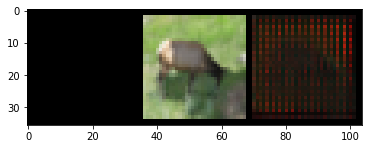

Training - Epoch 8
overall - overall_loss = 0.4163129925727844
generator - g_loss = 0.01353541947901249
classifier - c_loss = 1.3561275005340576 acc = 0.50804


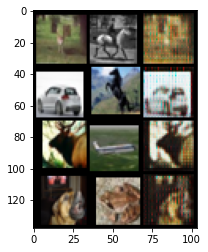

Testing - Epoch 8
overall - overall_loss = 0.40210527181625366
generator - g_loss = 0.02020132914185524
classifier - c_loss = 1.2932143211364746 acc = 0.5385
Save best checkpoint with overall loss 0.40210527181625366 - g_loss 0.02020132914185524 - c_loss 1.2932143211364746


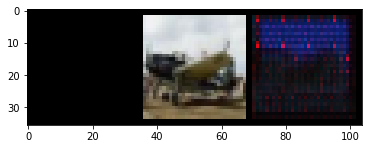

Training - Epoch 9
overall - overall_loss = 0.4048643112182617
generator - g_loss = 0.013306423090398312
classifier - c_loss = 1.3184983730316162 acc = 0.52172


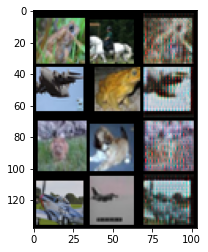

Testing - Epoch 9
overall - overall_loss = 0.41870564222335815
generator - g_loss = 0.014213388785719872
classifier - c_loss = 1.3625208139419556 acc = 0.5135


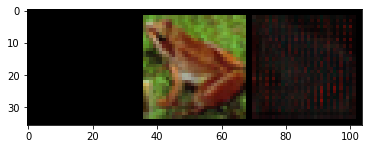

Training - Epoch 10
overall - overall_loss = 0.38961970806121826
generator - g_loss = 0.013010198250412941
classifier - c_loss = 1.2683753967285156 acc = 0.54732


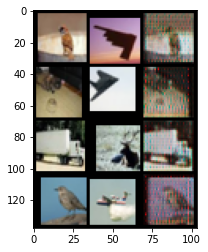

Testing - Epoch 10
overall - overall_loss = 0.4205359220504761
generator - g_loss = 0.011284998618066311
classifier - c_loss = 1.3754547834396362 acc = 0.5226


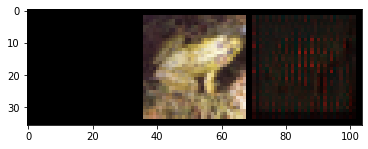

Training - Epoch 11
overall - overall_loss = 0.3824721872806549
generator - g_loss = 0.013707387261092663
classifier - c_loss = 1.2429245710372925 acc = 0.551


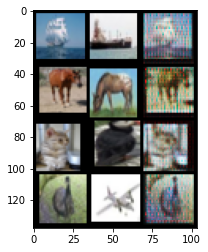

Testing - Epoch 11
overall - overall_loss = 0.3671775758266449
generator - g_loss = 0.005704146344214678
classifier - c_loss = 1.2106153964996338 acc = 0.5683
Save best checkpoint with overall loss 0.3671775758266449 - g_loss 0.005704146344214678 - c_loss 1.2106153964996338


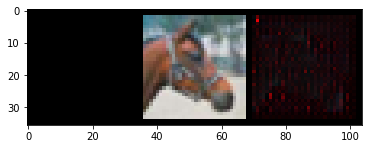

Training - Epoch 12
overall - overall_loss = 0.37132298946380615
generator - g_loss = 0.013514215126633644
classifier - c_loss = 1.2062095403671265 acc = 0.56964


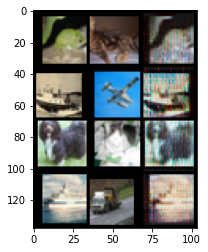

Testing - Epoch 12
overall - overall_loss = 0.40813544392585754
generator - g_loss = 0.013137456960976124
classifier - c_loss = 1.329797387123108 acc = 0.5413


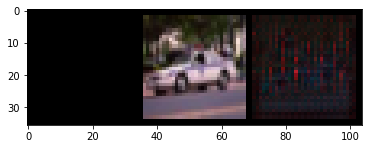

Training - Epoch 13
overall - overall_loss = 0.3578827381134033
generator - g_loss = 0.014456450939178467
classifier - c_loss = 1.159210443496704 acc = 0.58592


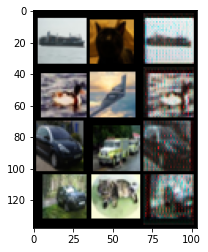

Testing - Epoch 13
overall - overall_loss = 0.3472846448421478
generator - g_loss = 0.014115476980805397
classifier - c_loss = 1.124679446220398 acc = 0.5989
Save best checkpoint with overall loss 0.3472846448421478 - g_loss 0.014115476980805397 - c_loss 1.124679446220398


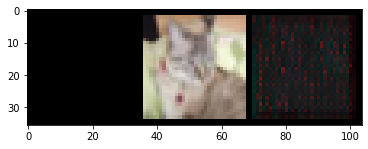

Training - Epoch 14
overall - overall_loss = 0.3422349989414215
generator - g_loss = 0.015449893660843372
classifier - c_loss = 1.1047332286834717 acc = 0.6078


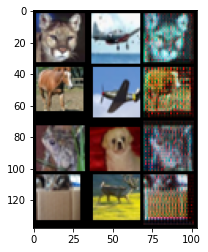

Testing - Epoch 14
overall - overall_loss = 0.3458096385002136
generator - g_loss = 0.018230659887194633
classifier - c_loss = 1.1101605892181396 acc = 0.6139
Save best checkpoint with overall loss 0.3458096385002136 - g_loss 0.018230659887194633 - c_loss 1.1101605892181396


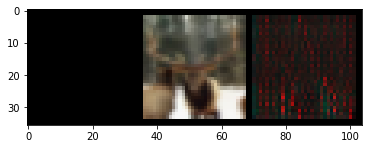

Training - Epoch 15
overall - overall_loss = 0.32925933599472046
generator - g_loss = 0.015399985015392303
classifier - c_loss = 1.0615980625152588 acc = 0.62208


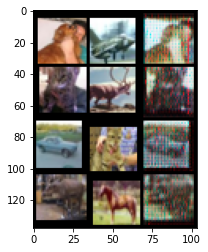

Testing - Epoch 15
overall - overall_loss = 0.30803102254867554
generator - g_loss = 0.011088375002145767
classifier - c_loss = 1.0008971691131592 acc = 0.6427
Save best checkpoint with overall loss 0.30803102254867554 - g_loss 0.011088375002145767 - c_loss 1.0008971691131592


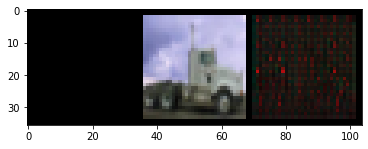

Training - Epoch 16
overall - overall_loss = 0.309352308511734
generator - g_loss = 0.016426818445324898
classifier - c_loss = 0.9928443431854248 acc = 0.64856


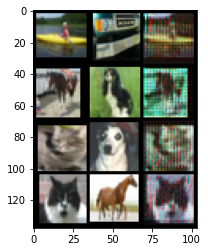

Testing - Epoch 16
overall - overall_loss = 0.31831490993499756
generator - g_loss = 0.015842637047171593
classifier - c_loss = 1.0240834951400757 acc = 0.6335


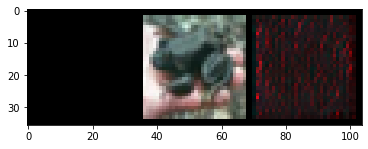

Training - Epoch 17
overall - overall_loss = 0.2999158501625061
generator - g_loss = 0.015965459868311882
classifier - c_loss = 0.9624664783477783 acc = 0.66008


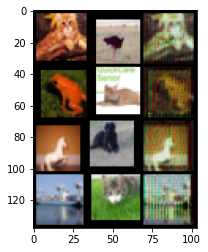

Testing - Epoch 17
overall - overall_loss = 0.31183576583862305
generator - g_loss = 0.01559295505285263
classifier - c_loss = 1.0030689239501953 acc = 0.6447


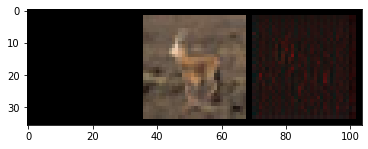

Training - Epoch 18
overall - overall_loss = 0.2895173728466034
generator - g_loss = 0.015986712649464607
classifier - c_loss = 0.9277552366256714 acc = 0.67344


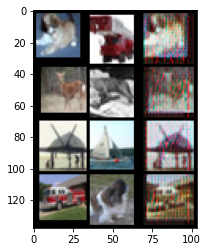

Testing - Epoch 18
overall - overall_loss = 0.28200769424438477
generator - g_loss = 0.010591457597911358
classifier - c_loss = 0.9153123497962952 acc = 0.6771
Save best checkpoint with overall loss 0.28200769424438477 - g_loss 0.010591457597911358 - c_loss 0.9153123497962952


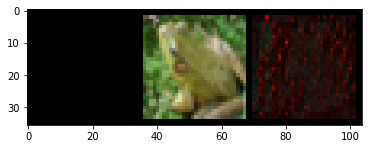

Training - Epoch 19
overall - overall_loss = 0.27838799357414246
generator - g_loss = 0.016357704997062683
classifier - c_loss = 0.8897916674613953 acc = 0.6876


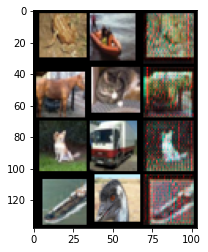

Testing - Epoch 19
overall - overall_loss = 0.2733953893184662
generator - g_loss = 0.013498222455382347
classifier - c_loss = 0.8798220753669739 acc = 0.6871
Save best checkpoint with overall loss 0.2733953893184662 - g_loss 0.013498222455382347 - c_loss 0.8798220753669739


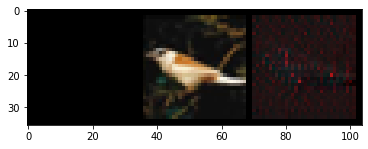

Training - Epoch 20
overall - overall_loss = 0.27635473012924194
generator - g_loss = 0.015927506610751152
classifier - c_loss = 0.8840179443359375 acc = 0.689


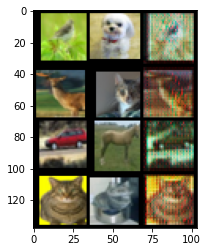

Testing - Epoch 20
overall - overall_loss = 0.26073768734931946
generator - g_loss = 0.016378436237573624
classifier - c_loss = 0.830909252166748 acc = 0.7066
Save best checkpoint with overall loss 0.26073768734931946 - g_loss 0.016378436237573624 - c_loss 0.830909252166748


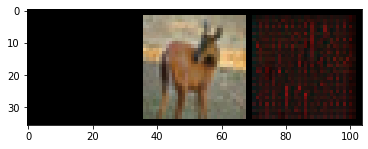

Training - Epoch 21
overall - overall_loss = 0.263636976480484
generator - g_loss = 0.015906494110822678
classifier - c_loss = 0.8416752219200134 acc = 0.70344


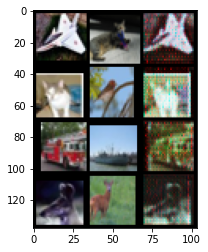

Testing - Epoch 21
overall - overall_loss = 0.2850213646888733
generator - g_loss = 0.01055362168699503
classifier - c_loss = 0.925446093082428 acc = 0.6839


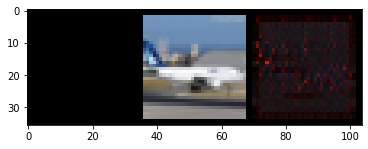

Training - Epoch 22
overall - overall_loss = 0.25490009784698486
generator - g_loss = 0.015445644035935402
classifier - c_loss = 0.8136272430419922 acc = 0.71536


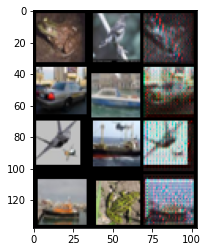

Testing - Epoch 22
overall - overall_loss = 0.27429404854774475
generator - g_loss = 0.013420932926237583
classifier - c_loss = 0.8829980492591858 acc = 0.694


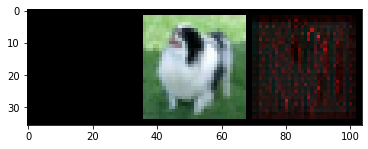

Training - Epoch 23
overall - overall_loss = 0.2512459456920624
generator - g_loss = 0.015820613130927086
classifier - c_loss = 0.8005719184875488 acc = 0.71884


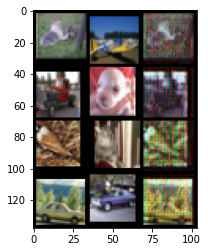

Testing - Epoch 23
overall - overall_loss = 0.2863500714302063
generator - g_loss = 0.014945413917303085
classifier - c_loss = 0.9196274876594543 acc = 0.689


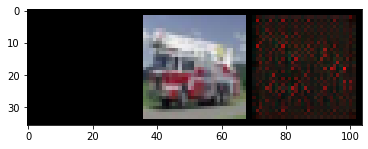

Training - Epoch 24
overall - overall_loss = 0.2446700781583786
generator - g_loss = 0.015712182968854904
classifier - c_loss = 0.7789044976234436 acc = 0.72672


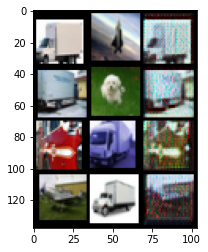

Testing - Epoch 24
overall - overall_loss = 0.2546765208244324
generator - g_loss = 0.009082257747650146
classifier - c_loss = 0.8277297616004944 acc = 0.712
Save best checkpoint with overall loss 0.2546765208244324 - g_loss 0.009082257747650146 - c_loss 0.8277297616004944


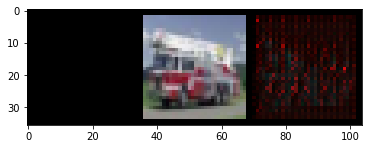

Training - Epoch 25
overall - overall_loss = 0.23764415085315704
generator - g_loss = 0.015706177800893784
classifier - c_loss = 0.7554993629455566 acc = 0.73508


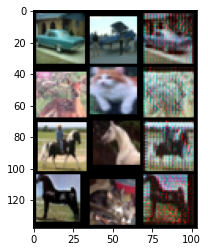

Testing - Epoch 25
overall - overall_loss = 0.2378842681646347
generator - g_loss = 0.014136360958218575
classifier - c_loss = 0.7599627375602722 acc = 0.7332
Save best checkpoint with overall loss 0.2378842681646347 - g_loss 0.014136360958218575 - c_loss 0.7599627375602722


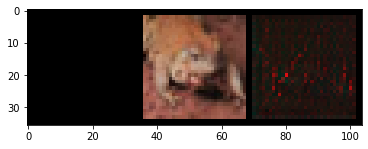

Training - Epoch 26
overall - overall_loss = 0.23334833979606628
generator - g_loss = 0.015729842707514763
classifier - c_loss = 0.7411242127418518 acc = 0.7398


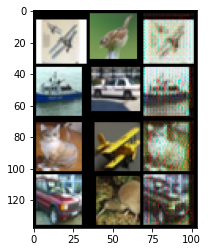

Testing - Epoch 26
overall - overall_loss = 0.28313130140304565
generator - g_loss = 0.011608992703258991
classifier - c_loss = 0.9166837930679321 acc = 0.7018


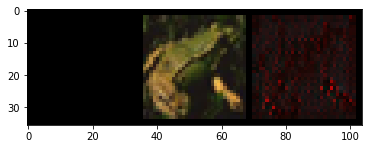

Training - Epoch 27
overall - overall_loss = 0.23118969798088074
generator - g_loss = 0.015622619539499283
classifier - c_loss = 0.7341796159744263 acc = 0.74312


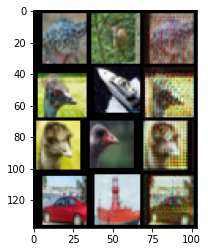

Testing - Epoch 27
overall - overall_loss = 0.3440372347831726
generator - g_loss = 0.01370036881417036
classifier - c_loss = 1.1148228645324707 acc = 0.6414


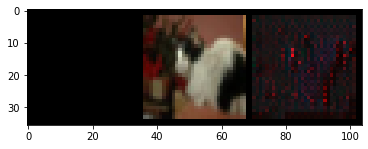

Training - Epoch 28
overall - overall_loss = 0.22603438794612885
generator - g_loss = 0.015611112117767334
classifier - c_loss = 0.7170215249061584 acc = 0.74976


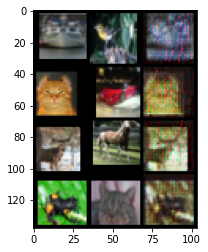

Testing - Epoch 28
overall - overall_loss = 0.2474888414144516
generator - g_loss = 0.012547522783279419
classifier - c_loss = 0.7956851720809937 acc = 0.7254


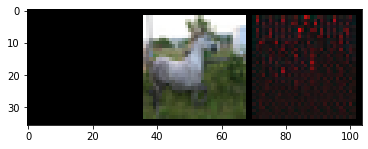

Training - Epoch 29
overall - overall_loss = 0.2215755581855774
generator - g_loss = 0.015608571469783783
classifier - c_loss = 0.7021652460098267 acc = 0.7552


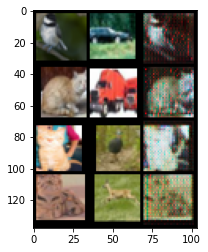

Testing - Epoch 29
overall - overall_loss = 0.25875818729400635
generator - g_loss = 0.012822190299630165
classifier - c_loss = 0.8326089382171631 acc = 0.7187


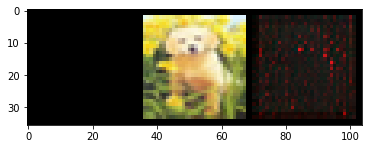

Training - Epoch 30
overall - overall_loss = 0.21663989126682281
generator - g_loss = 0.01572960987687111
classifier - c_loss = 0.6854307055473328 acc = 0.76132


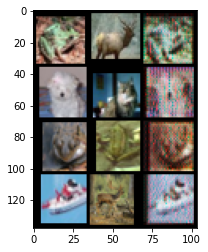

Testing - Epoch 30
overall - overall_loss = 0.23169982433319092
generator - g_loss = 0.013771360740065575
classifier - c_loss = 0.7401995658874512 acc = 0.7447
Save best checkpoint with overall loss 0.23169982433319092 - g_loss 0.013771360740065575 - c_loss 0.7401995658874512


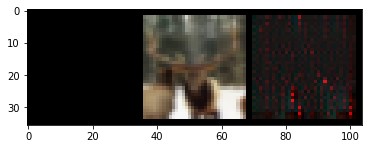

Training - Epoch 31
overall - overall_loss = 0.2113342583179474
generator - g_loss = 0.015570883639156818
classifier - c_loss = 0.6681153178215027 acc = 0.76616


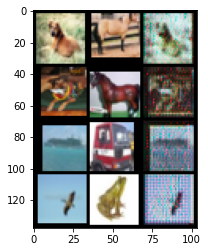

Testing - Epoch 31
overall - overall_loss = 0.21644775569438934
generator - g_loss = 0.012621358036994934
classifier - c_loss = 0.6920425891876221 acc = 0.7566
Save best checkpoint with overall loss 0.21644775569438934 - g_loss 0.012621358036994934 - c_loss 0.6920425891876221


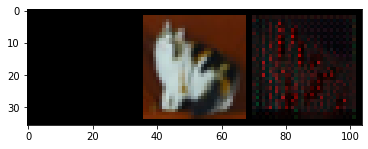

Training - Epoch 32
overall - overall_loss = 0.2081775665283203
generator - g_loss = 0.01547104213386774
classifier - c_loss = 0.657825767993927 acc = 0.76644


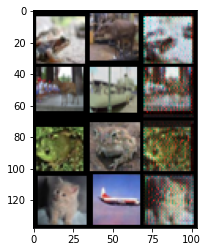

Testing - Epoch 32
overall - overall_loss = 0.24472922086715698
generator - g_loss = 0.01251119002699852
classifier - c_loss = 0.7865712642669678 acc = 0.7356


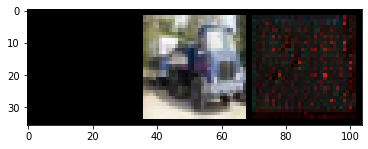

Training - Epoch 33
overall - overall_loss = 0.2053711861371994
generator - g_loss = 0.0159507654607296
classifier - c_loss = 0.6473524570465088 acc = 0.77084


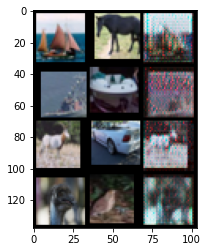

Testing - Epoch 33
overall - overall_loss = 0.2222120314836502
generator - g_loss = 0.01600711978971958
classifier - c_loss = 0.7033566832542419 acc = 0.7556


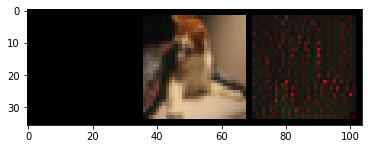

Training - Epoch 34
overall - overall_loss = 0.2001757174730301
generator - g_loss = 0.015873387455940247
classifier - c_loss = 0.6302144527435303 acc = 0.78084


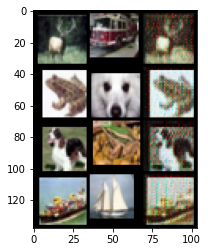

Testing - Epoch 34
overall - overall_loss = 0.2501240074634552
generator - g_loss = 0.014081061817705631
classifier - c_loss = 0.8008909225463867 acc = 0.729


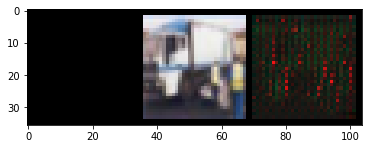

Training - Epoch 35
overall - overall_loss = 0.19562339782714844
generator - g_loss = 0.015703465789556503
classifier - c_loss = 0.6154365539550781 acc = 0.78124


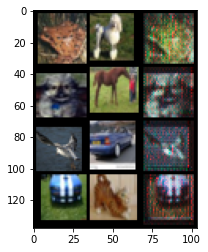

Testing - Epoch 35
overall - overall_loss = 0.2221820056438446
generator - g_loss = 0.011316747404634953
classifier - c_loss = 0.7142009139060974 acc = 0.7619


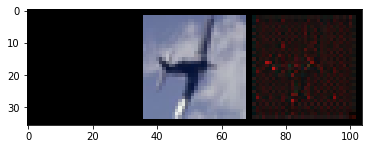

Training - Epoch 36
overall - overall_loss = 0.19347302615642548
generator - g_loss = 0.016140498220920563
classifier - c_loss = 0.607248842716217 acc = 0.78632


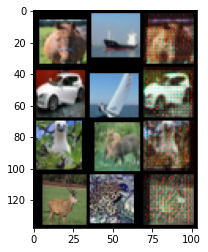

Testing - Epoch 36
overall - overall_loss = 0.24379649758338928
generator - g_loss = 0.009757708758115768
classifier - c_loss = 0.789887011051178 acc = 0.7396


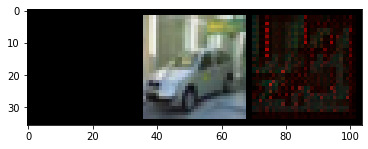

Training - Epoch 37
overall - overall_loss = 0.19103550910949707
generator - g_loss = 0.015032703056931496
classifier - c_loss = 0.601708710193634 acc = 0.79008


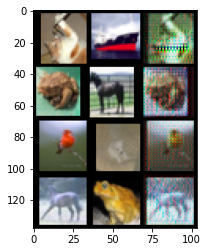

Testing - Epoch 37
overall - overall_loss = 0.21157975494861603
generator - g_loss = 0.015417462214827538
classifier - c_loss = 0.6692918539047241 acc = 0.7688
Save best checkpoint with overall loss 0.21157975494861603 - g_loss 0.015417462214827538 - c_loss 0.6692918539047241


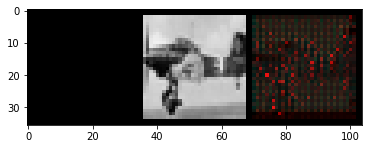

Training - Epoch 38
overall - overall_loss = 0.18765965104103088
generator - g_loss = 0.015886690467596054
classifier - c_loss = 0.5884634256362915 acc = 0.7944


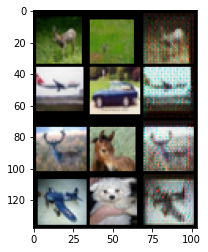

Testing - Epoch 38
overall - overall_loss = 0.2384292483329773
generator - g_loss = 0.012330511584877968
classifier - c_loss = 0.7659928798675537 acc = 0.7505


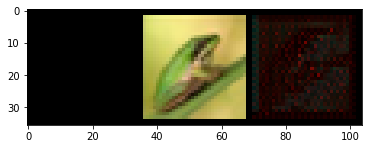

Training - Epoch 39
overall - overall_loss = 0.18731538951396942
generator - g_loss = 0.015534315258264542
classifier - c_loss = 0.5881380438804626 acc = 0.79148


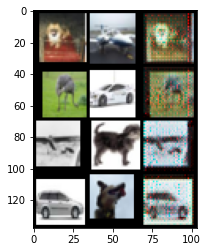

Testing - Epoch 39
overall - overall_loss = 0.2263369858264923
generator - g_loss = 0.013072222471237183
classifier - c_loss = 0.7239547371864319 acc = 0.7526


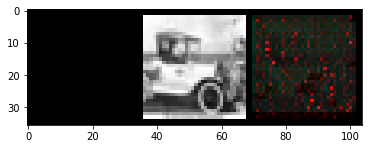

Training - Epoch 40
overall - overall_loss = 0.18380844593048096
generator - g_loss = 0.015476089902222157
classifier - c_loss = 0.5765843391418457 acc = 0.79864


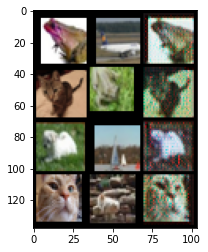

Testing - Epoch 40
overall - overall_loss = 0.23520269989967346
generator - g_loss = 0.011582852341234684
classifier - c_loss = 0.7569822669029236 acc = 0.746


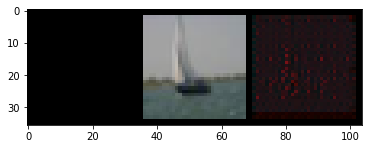

Training - Epoch 41
overall - overall_loss = 0.18199105560779572
generator - g_loss = 0.01553698442876339
classifier - c_loss = 0.5703837871551514 acc = 0.7992


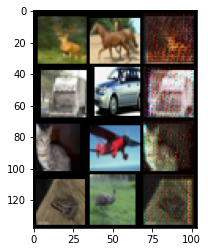

Testing - Epoch 41
overall - overall_loss = 0.20457243919372559
generator - g_loss = 0.012374063953757286
classifier - c_loss = 0.6530355215072632 acc = 0.7773
Save best checkpoint with overall loss 0.20457243919372559 - g_loss 0.012374063953757286 - c_loss 0.6530355215072632


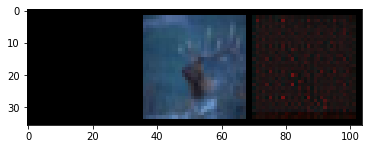

Training - Epoch 42
overall - overall_loss = 0.17922696471214294
generator - g_loss = 0.015027090907096863
classifier - c_loss = 0.5623602867126465 acc = 0.80528


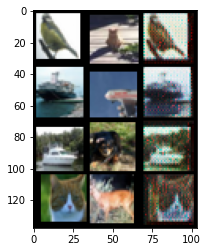

Testing - Epoch 42
overall - overall_loss = 0.21274952590465546
generator - g_loss = 0.007803226355463266
classifier - c_loss = 0.6909574866294861 acc = 0.763


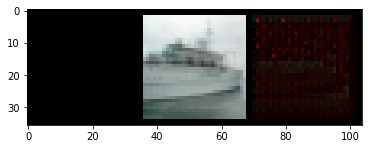

Training - Epoch 43
overall - overall_loss = 0.17444495856761932
generator - g_loss = 0.015104391612112522
classifier - c_loss = 0.5462401509284973 acc = 0.8086


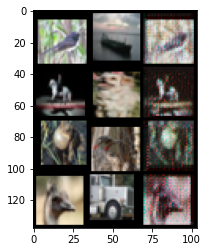

Testing - Epoch 43
overall - overall_loss = 0.23798897862434387
generator - g_loss = 0.01118689589202404
classifier - c_loss = 0.7671939134597778 acc = 0.7497


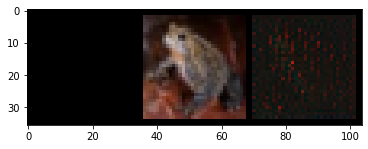

Training - Epoch 44
overall - overall_loss = 0.17129278182983398
generator - g_loss = 0.015426135621964931
classifier - c_loss = 0.5349821448326111 acc = 0.80908


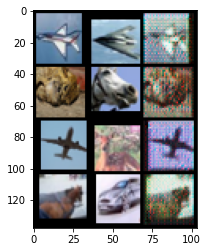

Testing - Epoch 44
overall - overall_loss = 0.2167808562517166
generator - g_loss = 0.012422312051057816
classifier - c_loss = 0.6936173439025879 acc = 0.7774


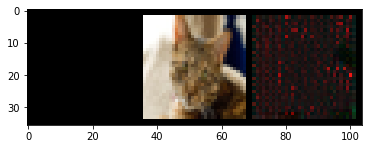

Training - Epoch 45
overall - overall_loss = 0.17049483954906464
generator - g_loss = 0.015366213396191597
classifier - c_loss = 0.5324616432189941 acc = 0.81112


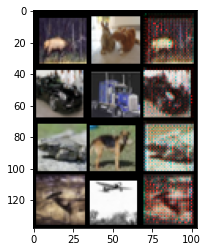

Testing - Epoch 45
overall - overall_loss = 0.20969462394714355
generator - g_loss = 0.01265832968056202
classifier - c_loss = 0.6694461107254028 acc = 0.7722


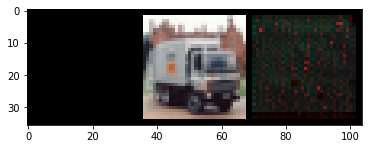

Training - Epoch 46
overall - overall_loss = 0.16677434742450714
generator - g_loss = 0.01562297809869051
classifier - c_loss = 0.5194609761238098 acc = 0.81748


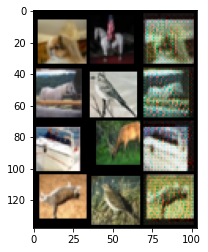

Testing - Epoch 46
overall - overall_loss = 0.21357876062393188
generator - g_loss = 0.010775333270430565
classifier - c_loss = 0.6867867708206177 acc = 0.7741


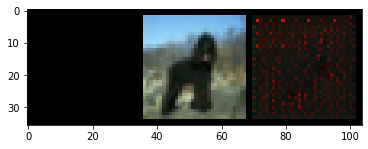

Training - Epoch 47
overall - overall_loss = 0.16795627772808075
generator - g_loss = 0.015359842218458652
classifier - c_loss = 0.5240147709846497 acc = 0.81488


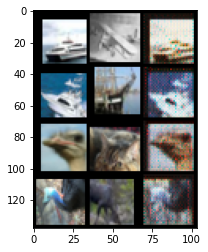

Testing - Epoch 47
overall - overall_loss = 0.19445137679576874
generator - g_loss = 0.012356930412352085
classifier - c_loss = 0.61933833360672 acc = 0.7949
Save best checkpoint with overall loss 0.19445137679576874 - g_loss 0.012356930412352085 - c_loss 0.61933833360672


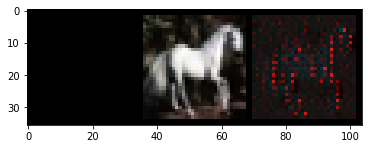

Training - Epoch 48
overall - overall_loss = 0.16126158833503723
generator - g_loss = 0.01523094717413187
classifier - c_loss = 0.5019994974136353 acc = 0.82544


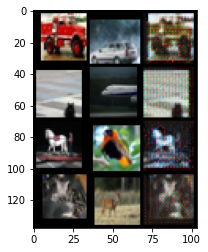

Testing - Epoch 48
overall - overall_loss = 0.20892927050590515
generator - g_loss = 0.010408280417323112
classifier - c_loss = 0.6721450090408325 acc = 0.7768


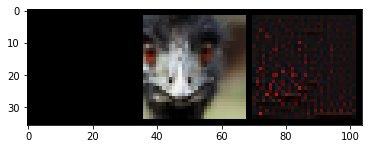

Training - Epoch 49
overall - overall_loss = 0.15996153652668
generator - g_loss = 0.01487757544964552
classifier - c_loss = 0.4984908401966095 acc = 0.82352


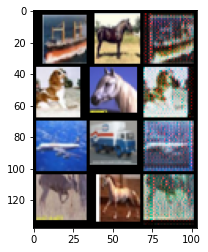

Testing - Epoch 49
overall - overall_loss = 0.2217739224433899
generator - g_loss = 0.0132528031244874
classifier - c_loss = 0.7083231210708618 acc = 0.7719


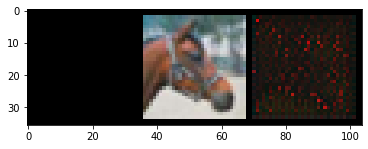

Training - Epoch 50
overall - overall_loss = 0.15831629931926727
generator - g_loss = 0.015390121378004551
classifier - c_loss = 0.4918106198310852 acc = 0.82436


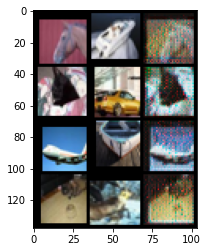

Testing - Epoch 50
overall - overall_loss = 0.21273937821388245
generator - g_loss = 0.010691567324101925
classifier - c_loss = 0.684184193611145 acc = 0.7787


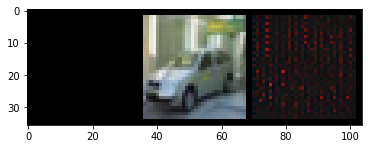

Training - Epoch 51
overall - overall_loss = 0.1593422293663025
generator - g_loss = 0.015611144714057446
classifier - c_loss = 0.4947146475315094 acc = 0.82552


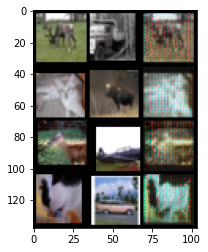

Testing - Epoch 51
overall - overall_loss = 0.20633766055107117
generator - g_loss = 0.013738051988184452
classifier - c_loss = 0.6557367444038391 acc = 0.7802


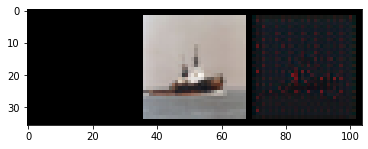

Training - Epoch 52
overall - overall_loss = 0.1544719636440277
generator - g_loss = 0.015174047090113163
classifier - c_loss = 0.4795006811618805 acc = 0.83336


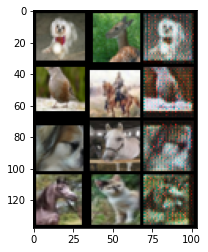

Testing - Epoch 52
overall - overall_loss = 0.19451658427715302
generator - g_loss = 0.010246889665722847
classifier - c_loss = 0.624479353427887 acc = 0.7942


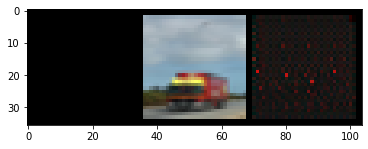

Training - Epoch 53
overall - overall_loss = 0.1537339985370636
generator - g_loss = 0.015326122753322124
classifier - c_loss = 0.47668561339378357 acc = 0.82956


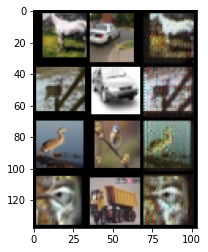

Testing - Epoch 53
overall - overall_loss = 0.24068863689899445
generator - g_loss = 0.009701361879706383
classifier - c_loss = 0.7796589136123657 acc = 0.7595


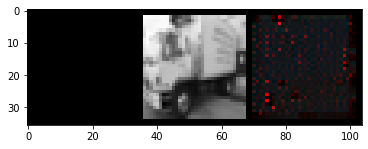

Training - Epoch 54
overall - overall_loss = 0.14996680617332458
generator - g_loss = 0.015026957727968693
classifier - c_loss = 0.4648262858390808 acc = 0.83556


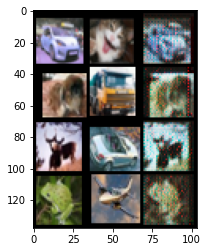

Testing - Epoch 54
overall - overall_loss = 0.2943594455718994
generator - g_loss = 0.012020537629723549
classifier - c_loss = 0.9531504511833191 acc = 0.7263


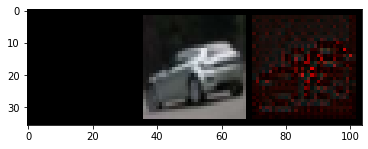

Training - Epoch 55
overall - overall_loss = 0.1495765894651413
generator - g_loss = 0.015521918423473835
classifier - c_loss = 0.4623710513114929 acc = 0.83632


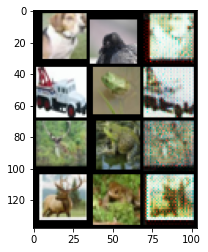

Testing - Epoch 55
overall - overall_loss = 0.1987878680229187
generator - g_loss = 0.012439261190593243
classifier - c_loss = 0.6336012482643127 acc = 0.7905


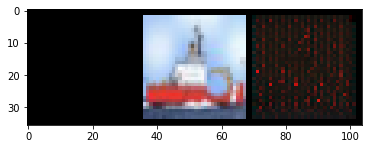

Training - Epoch 56
overall - overall_loss = 0.14682236313819885
generator - g_loss = 0.015766972675919533
classifier - c_loss = 0.45261818170547485 acc = 0.83968


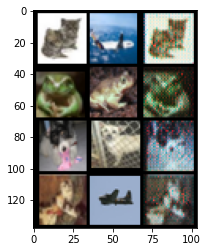

Testing - Epoch 56
overall - overall_loss = 0.22235795855522156
generator - g_loss = 0.010488156229257584
classifier - c_loss = 0.7167207598686218 acc = 0.7711


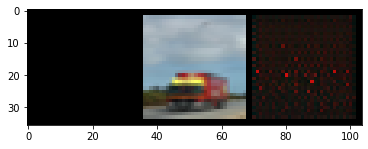

Training - Epoch 57
overall - overall_loss = 0.14509178698062897
generator - g_loss = 0.01497634407132864
classifier - c_loss = 0.44869464635849 acc = 0.84344


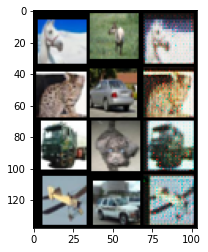

Testing - Epoch 57
overall - overall_loss = 0.2105599045753479
generator - g_loss = 0.008305709809064865
classifier - c_loss = 0.6824862957000732 acc = 0.7817


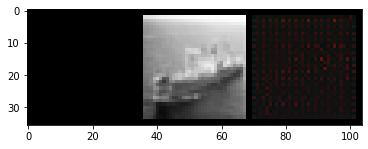

Training - Epoch 58
overall - overall_loss = 0.1426810920238495
generator - g_loss = 0.015010291710495949
classifier - c_loss = 0.4405795931816101 acc = 0.84624


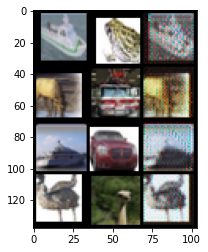

Testing - Epoch 58
overall - overall_loss = 0.20281808078289032
generator - g_loss = 0.009766461327672005
classifier - c_loss = 0.6532718539237976 acc = 0.7863


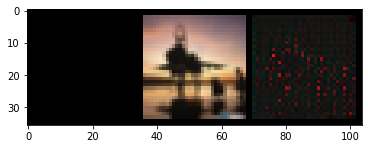

Training - Epoch 59
overall - overall_loss = 0.13828186690807343
generator - g_loss = 0.01493107620626688
classifier - c_loss = 0.42610013484954834 acc = 0.85052


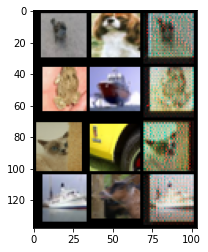

Testing - Epoch 59
overall - overall_loss = 0.24175211787223816
generator - g_loss = 0.009359708987176418
classifier - c_loss = 0.7840009927749634 acc = 0.7626


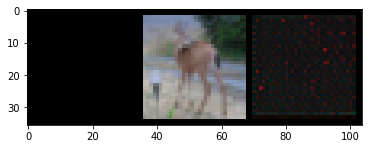

Training - Epoch 60
overall - overall_loss = 0.13848310708999634
generator - g_loss = 0.015479347668588161
classifier - c_loss = 0.42549124360084534 acc = 0.85008


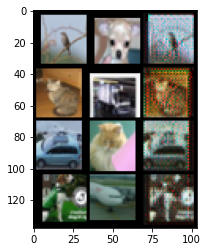

Testing - Epoch 60
overall - overall_loss = 0.2221636176109314
generator - g_loss = 0.009587189182639122
classifier - c_loss = 0.7181753516197205 acc = 0.766


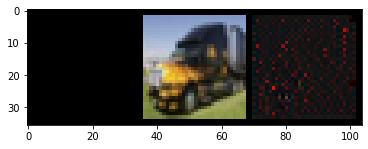

Training - Epoch 61
overall - overall_loss = 0.13826574385166168
generator - g_loss = 0.01512377429753542
classifier - c_loss = 0.42559710144996643 acc = 0.85252


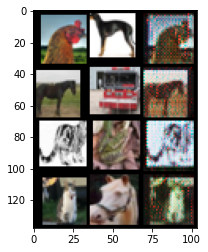

Testing - Epoch 61
overall - overall_loss = 0.21066388487815857
generator - g_loss = 0.012197263538837433
classifier - c_loss = 0.6737525463104248 acc = 0.7868


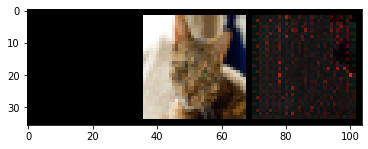

Training - Epoch 62
overall - overall_loss = 0.13668140769004822
generator - g_loss = 0.015279277227818966
classifier - c_loss = 0.41995325684547424 acc = 0.85276


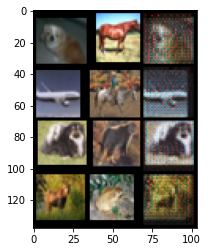

Testing - Epoch 62
overall - overall_loss = 0.22180183231830597
generator - g_loss = 0.008393647149205208
classifier - c_loss = 0.7197542786598206 acc = 0.7726


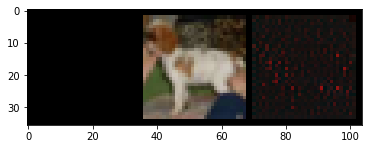

Training - Epoch 63
overall - overall_loss = 0.1358298510313034
generator - g_loss = 0.015282271429896355
classifier - c_loss = 0.41710761189460754 acc = 0.8544


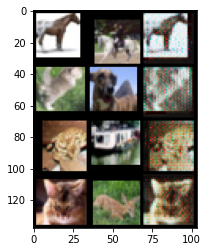

Testing - Epoch 63
overall - overall_loss = 0.22001183032989502
generator - g_loss = 0.010936679318547249
classifier - c_loss = 0.7078539133071899 acc = 0.7772


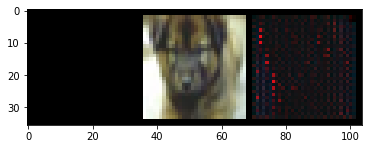

Training - Epoch 64
overall - overall_loss = 0.13269741833209991
generator - g_loss = 0.01484675146639347
classifier - c_loss = 0.4076821804046631 acc = 0.85724


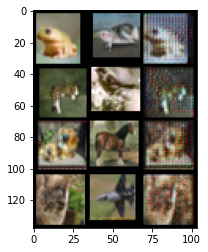

Testing - Epoch 64
overall - overall_loss = 0.2040422409772873
generator - g_loss = 0.011200910434126854
classifier - c_loss = 0.6540053486824036 acc = 0.7919


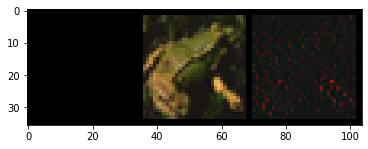

Training - Epoch 65
overall - overall_loss = 0.1298510879278183
generator - g_loss = 0.015562798827886581
classifier - c_loss = 0.3965236246585846 acc = 0.86036


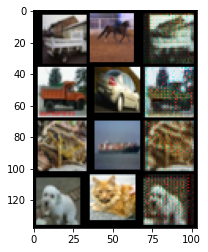

Testing - Epoch 65
overall - overall_loss = 0.192550927400589
generator - g_loss = 0.00938077550381422
classifier - c_loss = 0.6199479103088379 acc = 0.8012
Save best checkpoint with overall loss 0.192550927400589 - g_loss 0.00938077550381422 - c_loss 0.6199479103088379


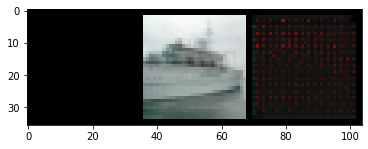

Training - Epoch 66
overall - overall_loss = 0.1289176344871521
generator - g_loss = 0.015357223339378834
classifier - c_loss = 0.39389175176620483 acc = 0.85996


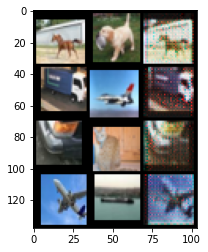

Testing - Epoch 66
overall - overall_loss = 0.2046566754579544
generator - g_loss = 0.009577676653862
classifier - c_loss = 0.6598410606384277 acc = 0.7893


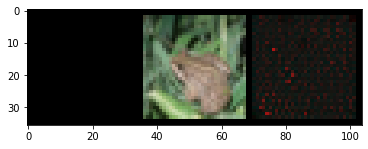

Training - Epoch 67
overall - overall_loss = 0.13028821349143982
generator - g_loss = 0.015554576180875301
classifier - c_loss = 0.39800015091896057 acc = 0.85848


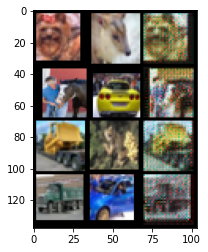

Testing - Epoch 67
overall - overall_loss = 0.18864436447620392
generator - g_loss = 0.010260852985084057
classifier - c_loss = 0.6048725247383118 acc = 0.8048
Save best checkpoint with overall loss 0.18864436447620392 - g_loss 0.010260852985084057 - c_loss 0.6048725247383118


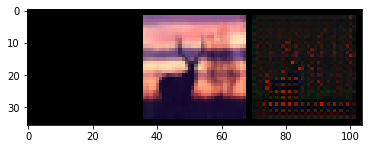

Training - Epoch 68
overall - overall_loss = 0.12824858725070953
generator - g_loss = 0.014930333010852337
classifier - c_loss = 0.392657995223999 acc = 0.86252


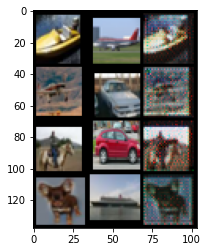

Testing - Epoch 68
overall - overall_loss = 0.2161310911178589
generator - g_loss = 0.008085942827165127
classifier - c_loss = 0.7015698552131653 acc = 0.7814


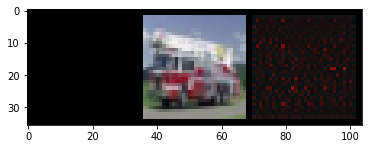

Training - Epoch 69
overall - overall_loss = 0.12431712448596954
generator - g_loss = 0.015145106241106987
classifier - c_loss = 0.3790517747402191 acc = 0.86768


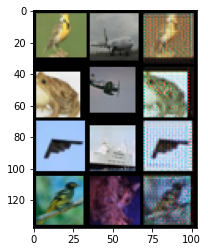

Testing - Epoch 69
overall - overall_loss = 0.19977933168411255
generator - g_loss = 0.009569333866238594
classifier - c_loss = 0.643602728843689 acc = 0.7968


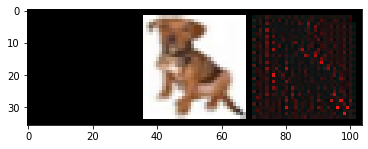

Training - Epoch 70
overall - overall_loss = 0.12617766857147217
generator - g_loss = 0.015732411295175552
classifier - c_loss = 0.3838832676410675 acc = 0.86436


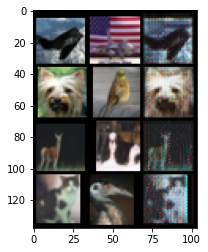

Testing - Epoch 70
overall - overall_loss = 0.1890498548746109
generator - g_loss = 0.012253377586603165
classifier - c_loss = 0.6015748381614685 acc = 0.8067


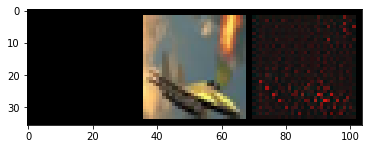

Training - Epoch 71
overall - overall_loss = 0.12332600355148315
generator - g_loss = 0.01529658492654562
classifier - c_loss = 0.3753945529460907 acc = 0.86612


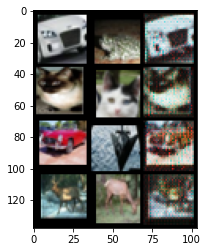

Testing - Epoch 71
overall - overall_loss = 0.19907476007938385
generator - g_loss = 0.009844232350587845
classifier - c_loss = 0.6406124830245972 acc = 0.7992


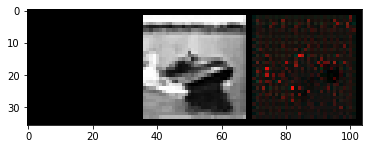

Training - Epoch 72
overall - overall_loss = 0.12181408703327179
generator - g_loss = 0.015005001798272133
classifier - c_loss = 0.37103527784347534 acc = 0.86872


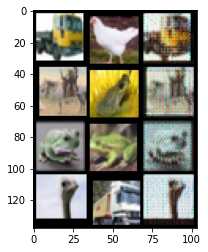

Testing - Epoch 72
overall - overall_loss = 0.20529472827911377
generator - g_loss = 0.013516859151422977
classifier - c_loss = 0.6527763605117798 acc = 0.7904


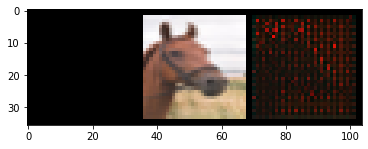

Training - Epoch 73
overall - overall_loss = 0.11896611005067825
generator - g_loss = 0.015153884887695312
classifier - c_loss = 0.3611948490142822 acc = 0.87132


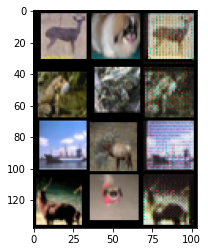

Testing - Epoch 73
overall - overall_loss = 0.20507892966270447
generator - g_loss = 0.009226626716554165
classifier - c_loss = 0.6620675325393677 acc = 0.7968


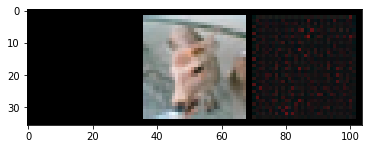

Training - Epoch 74
overall - overall_loss = 0.1195942759513855
generator - g_loss = 0.015140409581363201
classifier - c_loss = 0.3633204996585846 acc = 0.86876


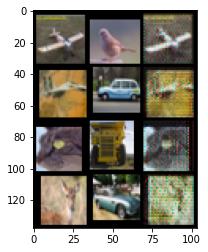

Testing - Epoch 74
overall - overall_loss = 0.2059081494808197
generator - g_loss = 0.011239828541874886
classifier - c_loss = 0.6601341366767883 acc = 0.8005


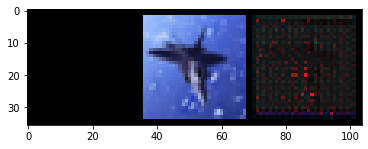

Training - Epoch 75
overall - overall_loss = 0.11709584295749664
generator - g_loss = 0.014946063049137592
classifier - c_loss = 0.35544535517692566 acc = 0.87448


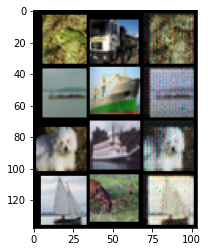

Testing - Epoch 75
overall - overall_loss = 0.20147813856601715
generator - g_loss = 0.011151868849992752
classifier - c_loss = 0.6455727815628052 acc = 0.8056


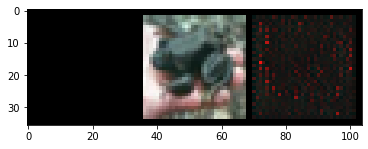

Training - Epoch 76
overall - overall_loss = 0.11459828168153763
generator - g_loss = 0.0148228220641613
classifier - c_loss = 0.3474074900150299 acc = 0.87644


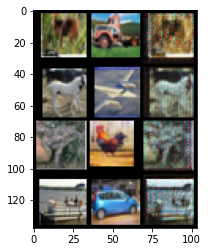

Testing - Epoch 76
overall - overall_loss = 0.2009178251028061
generator - g_loss = 0.011034626513719559
classifier - c_loss = 0.6439785361289978 acc = 0.8013


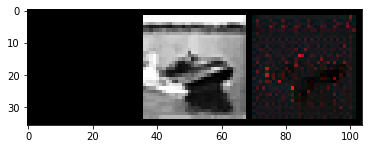

Training - Epoch 77
overall - overall_loss = 0.11450494825839996
generator - g_loss = 0.015145807527005672
classifier - c_loss = 0.3463428020477295 acc = 0.87868


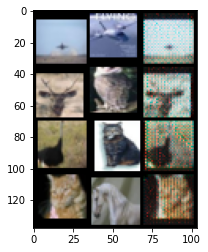

Testing - Epoch 77
overall - overall_loss = 0.1888275295495987
generator - g_loss = 0.00792117603123188
classifier - c_loss = 0.6109424829483032 acc = 0.8093


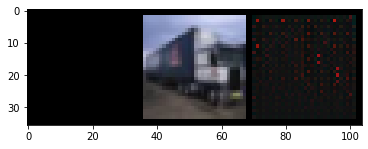

Training - Epoch 78
overall - overall_loss = 0.1147862896323204
generator - g_loss = 0.015257411636412144
classifier - c_loss = 0.34702038764953613 acc = 0.8774


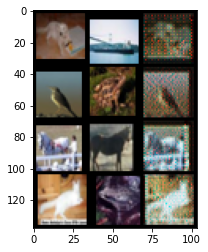

Testing - Epoch 78
overall - overall_loss = 0.19302865862846375
generator - g_loss = 0.008460978046059608
classifier - c_loss = 0.623686671257019 acc = 0.8158


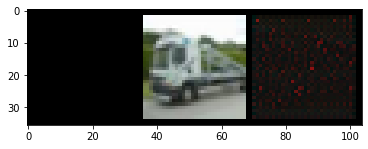

Training - Epoch 79
overall - overall_loss = 0.11497079581022263
generator - g_loss = 0.01586306281387806
classifier - c_loss = 0.34622228145599365 acc = 0.87952


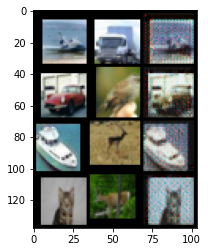

Testing - Epoch 79
overall - overall_loss = 0.22227685153484344
generator - g_loss = 0.00781549233943224
classifier - c_loss = 0.7226867079734802 acc = 0.785


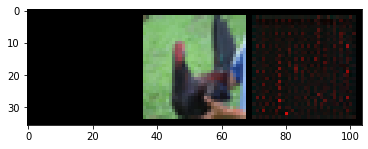

Training - Epoch 80
overall - overall_loss = 0.11147123575210571
generator - g_loss = 0.015363370068371296
classifier - c_loss = 0.3357227146625519 acc = 0.88368


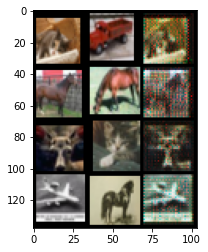

Testing - Epoch 80
overall - overall_loss = 0.208186537027359
generator - g_loss = 0.014546220190823078
classifier - c_loss = 0.6600139737129211 acc = 0.804


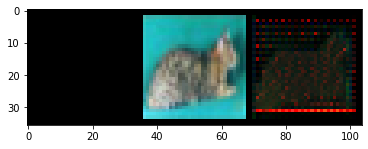

Training - Epoch 81
overall - overall_loss = 0.1078818142414093
generator - g_loss = 0.015199435874819756
classifier - c_loss = 0.3241405785083771 acc = 0.8848


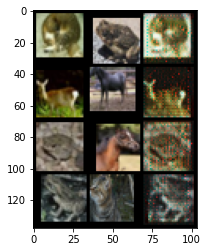

Testing - Epoch 81
overall - overall_loss = 0.19942958652973175
generator - g_loss = 0.009472910314798355
classifier - c_loss = 0.6426618695259094 acc = 0.806


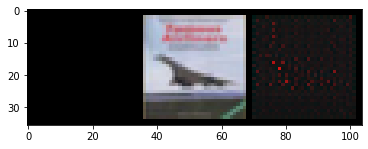

Training - Epoch 82
overall - overall_loss = 0.1109304428100586
generator - g_loss = 0.015514146536588669
classifier - c_loss = 0.33356818556785583 acc = 0.88088


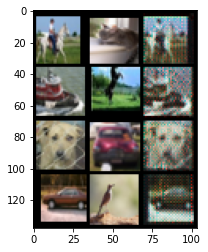

Testing - Epoch 82
overall - overall_loss = 0.21084098517894745
generator - g_loss = 0.013500137254595757
classifier - c_loss = 0.6713030338287354 acc = 0.8015


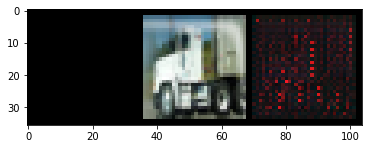

Training - Epoch 83
overall - overall_loss = 0.10522257536649704
generator - g_loss = 0.015520783141255379
classifier - c_loss = 0.31452658772468567 acc = 0.88848


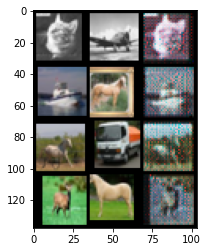

Testing - Epoch 83
overall - overall_loss = 0.19513024389743805
generator - g_loss = 0.008187060244381428
classifier - c_loss = 0.6313309669494629 acc = 0.8075


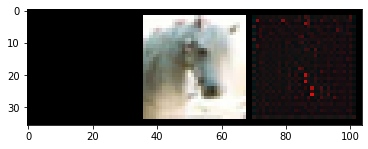

Training - Epoch 84
overall - overall_loss = 0.10515150427818298
generator - g_loss = 0.014869973994791508
classifier - c_loss = 0.3158082067966461 acc = 0.88964


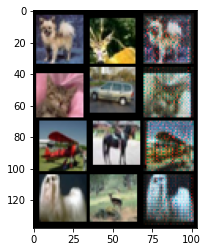

Testing - Epoch 84
overall - overall_loss = 0.2058352530002594
generator - g_loss = 0.010370503179728985
classifier - c_loss = 0.6619197130203247 acc = 0.8011


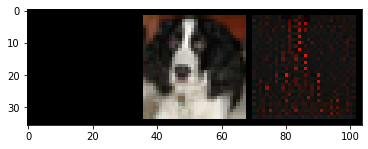

Training - Epoch 85
overall - overall_loss = 0.10724049806594849
generator - g_loss = 0.014795740135014057
classifier - c_loss = 0.3229447901248932 acc = 0.88656


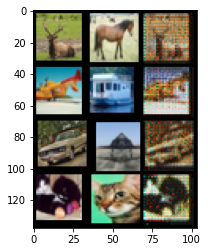

Testing - Epoch 85
overall - overall_loss = 0.1934281885623932
generator - g_loss = 0.010164769366383553
classifier - c_loss = 0.6210426688194275 acc = 0.8115


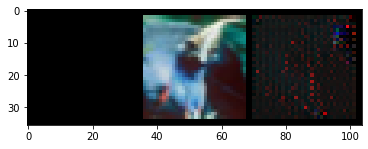

Training - Epoch 86
overall - overall_loss = 0.10355699062347412
generator - g_loss = 0.014615105465054512
classifier - c_loss = 0.311087965965271 acc = 0.89028


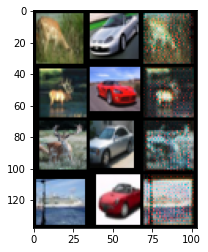

Testing - Epoch 86
overall - overall_loss = 0.22799071669578552
generator - g_loss = 0.00752603355795145
classifier - c_loss = 0.7424083352088928 acc = 0.7844


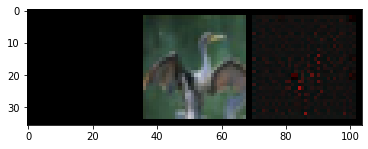

Training - Epoch 87
overall - overall_loss = 0.10669972747564316
generator - g_loss = 0.015016746707260609
classifier - c_loss = 0.32062670588493347 acc = 0.88684


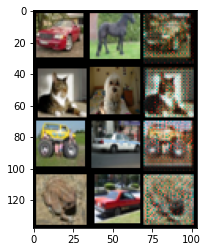

Testing - Epoch 87
overall - overall_loss = 0.1990869641304016
generator - g_loss = 0.009030407294631004
classifier - c_loss = 0.6425521969795227 acc = 0.8063


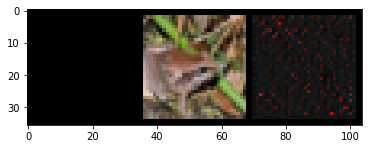

Training - Epoch 88
overall - overall_loss = 0.10109225660562515
generator - g_loss = 0.0148564912378788
classifier - c_loss = 0.3023090660572052 acc = 0.89084


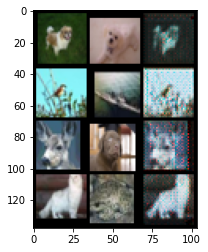

Testing - Epoch 88
overall - overall_loss = 0.22133180499076843
generator - g_loss = 0.008304107002913952
classifier - c_loss = 0.7183962464332581 acc = 0.7876


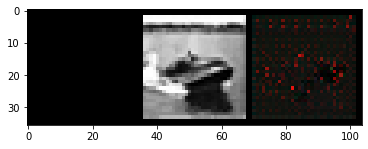

Training - Epoch 89
overall - overall_loss = 0.099185511469841
generator - g_loss = 0.015647539868950844
classifier - c_loss = 0.29410749673843384 acc = 0.8968


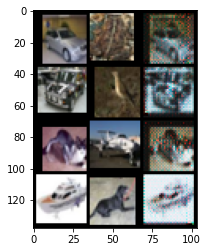

Testing - Epoch 89
overall - overall_loss = 0.2246178239583969
generator - g_loss = 0.011439642868936062
classifier - c_loss = 0.7220335602760315 acc = 0.7858


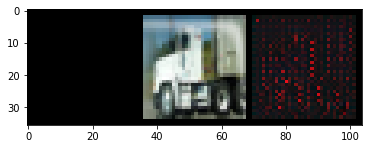

Training - Epoch 90
overall - overall_loss = 0.09873919934034348
generator - g_loss = 0.014955811202526093
classifier - c_loss = 0.2942337095737457 acc = 0.89504


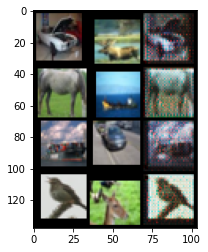

Testing - Epoch 90
overall - overall_loss = 0.19796150922775269
generator - g_loss = 0.01079034898430109
classifier - c_loss = 0.6346941590309143 acc = 0.8103


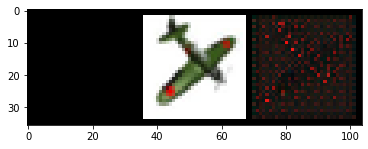

Training - Epoch 91
overall - overall_loss = 0.09893473237752914
generator - g_loss = 0.01581404358148575
classifier - c_loss = 0.2928830087184906 acc = 0.89492


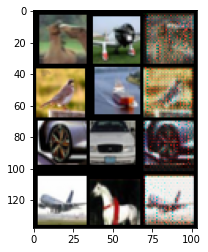

Testing - Epoch 91
overall - overall_loss = 0.2387138307094574
generator - g_loss = 0.014505965635180473
classifier - c_loss = 0.7618655562400818 acc = 0.7905


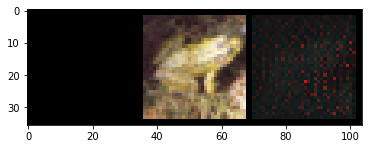

Training - Epoch 92
overall - overall_loss = 0.09790705144405365
generator - g_loss = 0.014940292574465275
classifier - c_loss = 0.2914961576461792 acc = 0.89688


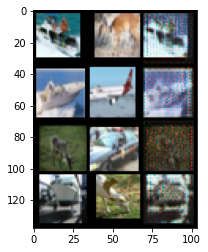

Testing - Epoch 92
overall - overall_loss = 0.19257548451423645
generator - g_loss = 0.009032247588038445
classifier - c_loss = 0.6208431124687195 acc = 0.8103


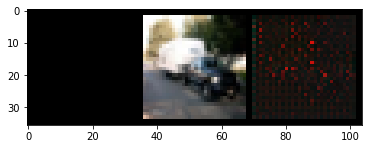

Training - Epoch 93
overall - overall_loss = 0.09633740037679672
generator - g_loss = 0.015609514899551868
classifier - c_loss = 0.284702330827713 acc = 0.89892


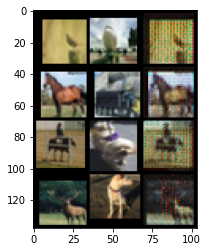

Testing - Epoch 93
overall - overall_loss = 0.2059023082256317
generator - g_loss = 0.009747624397277832
classifier - c_loss = 0.6635966300964355 acc = 0.8056


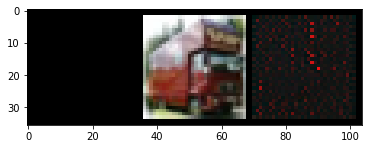

Training - Epoch 94
overall - overall_loss = 0.09576954692602158
generator - g_loss = 0.01547843124717474
classifier - c_loss = 0.28311535716056824 acc = 0.899


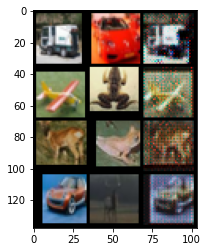

Testing - Epoch 94
overall - overall_loss = 0.19157832860946655
generator - g_loss = 0.008744245395064354
classifier - c_loss = 0.6181910634040833 acc = 0.8166


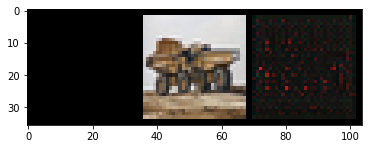

Training - Epoch 95
overall - overall_loss = 0.09450198709964752
generator - g_loss = 0.015607601031661034
classifier - c_loss = 0.27858877182006836 acc = 0.90236


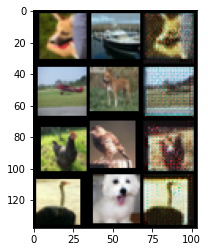

Testing - Epoch 95
overall - overall_loss = 0.22813859581947327
generator - g_loss = 0.010738469660282135
classifier - c_loss = 0.7354055643081665 acc = 0.7958


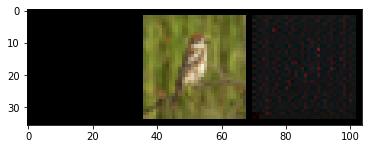

Training - Epoch 96
overall - overall_loss = 0.09366268664598465
generator - g_loss = 0.014916959218680859
classifier - c_loss = 0.2774028480052948 acc = 0.90336


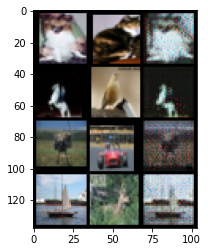

Testing - Epoch 96
overall - overall_loss = 0.22104120254516602
generator - g_loss = 0.008766942657530308
classifier - c_loss = 0.7163477540016174 acc = 0.7977


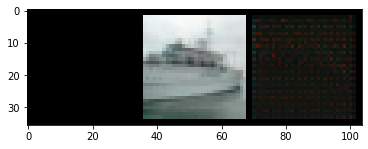

Training - Epoch 97
overall - overall_loss = 0.09057158976793289
generator - g_loss = 0.014948691241443157
classifier - c_loss = 0.2670251429080963 acc = 0.9054


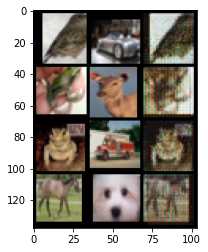

Testing - Epoch 97
overall - overall_loss = 0.21797767281532288
generator - g_loss = 0.008120219223201275
classifier - c_loss = 0.7076451182365417 acc = 0.8028


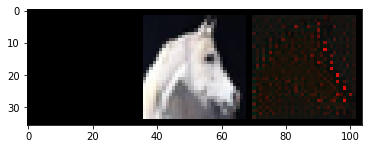

Training - Epoch 98
overall - overall_loss = 0.09312628954648972
generator - g_loss = 0.015066580846905708
classifier - c_loss = 0.2752656638622284 acc = 0.9038


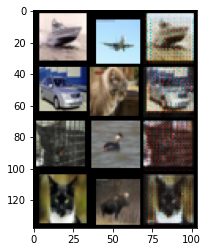

Testing - Epoch 98
overall - overall_loss = 0.2225627601146698
generator - g_loss = 0.008341610431671143
classifier - c_loss = 0.7224121689796448 acc = 0.7958


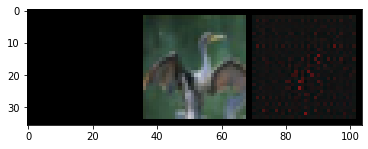

Training - Epoch 99
overall - overall_loss = 0.09096545726060867
generator - g_loss = 0.015029283240437508
classifier - c_loss = 0.2681499123573303 acc = 0.90484


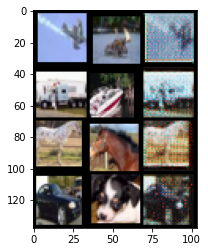

Testing - Epoch 99
overall - overall_loss = 0.1965945065021515
generator - g_loss = 0.009201683104038239
classifier - c_loss = 0.6338443160057068 acc = 0.8158


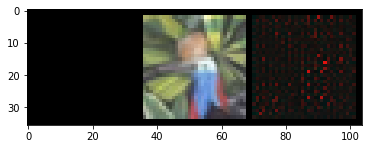

In [29]:
for epoch in range(100):
    train_end2end(train_loader, epoch, generator, classifier, mse_criterion, ce_criterion, cuda=True, show=True)
    test_end2end(test_loader, generator, classifier, ce_criterion, cuda=True, show=True)